In [58]:
!date

Wed Sep 13 11:06:02 PDT 2023


# Alignment v2 - QC and filtering
(Latest human ref genome used; transgenic CAR sequence in ref genome; Lamanno workflow)
## Quality control, basic filtering, and Leiden clustering

___

In [59]:
%config InlineBackend.figure_format = 'retina'
%load_ext blackcellmagic

import sys
import anndata
import glob
import numpy as np
from scipy import stats
from scipy import sparse
from scipy.io import mmread, mmwrite 
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

import gget
import kb_python.utils as kb_utils

import scanpy as sc
sc.set_figure_params(figsize=(6, 6), frameon=False)
sc.settings.n_jobs=2

# Set random seed
np.random.seed(926)

def nd(arr):
    """
    Funciton to transform numpy matrix to nd array.
    """
    return np.asarray(arr).reshape(-1)

The blackcellmagic extension is already loaded. To reload it, use:
  %reload_ext blackcellmagic


___

# Set colors, titles and fontsize for plotting:

In [60]:
colors = ["#33a02c", "#0571b0", "#e66101", "#984ea3"]*4
filter_colors = ["#b2df8a", "#cde7f7", "#f7dbc6", "#bebada"]*4
fontsize = 20

___

# Load data from h5ad's

In [61]:
datasets = glob.glob("../../COH_data/alignment_v2/*[!VDJ][!raw][!archive][!patient_mapping]/")
datasets

['../../COH_data/alignment_v2/UPN454_455_504_CART_K_X5SCR_SE7661_SA134622/',
 '../../COH_data/alignment_v2/UPN388_406_PB_I_X5SCR_SE6438_SA71770/',
 '../../COH_data/alignment_v2/UPN375_388_PSCA_PB_N_X5SCR_SE8003_SA157963/',
 '../../COH_data/alignment_v2/UPN388_394_PSCA_PB_P_X5SCR_SE8003_SA157965/',
 '../../COH_data/alignment_v2/UPN375_376_393_PB_A_X5SCR_SE6452_SA71977/',
 '../../COH_data/alignment_v2/UPN375_376_388_393_PSCA_CART_X5SCR_SE6080_SA58165/',
 '../../COH_data/alignment_v2/UPN376_393_406_PB_F_X5SCR_SE6435_SA71769/',
 '../../COH_data/alignment_v2/UPN375_403_406_PB_H_X5SCR_SE6437_SA71768/',
 '../../COH_data/alignment_v2/UPN393_403_406_PB_D_X5SCR_SE6452_SA71980/',
 '../../COH_data/alignment_v2/UPN375_388_PSCA_PB_O_X5SCR_SE8003_SA157964/',
 '../../COH_data/alignment_v2/UPN376_388_406_PB_E_X5SCR_SE6452_SA71981/',
 '../../COH_data/alignment_v2/UPN388_394_PSCA_PB_Q_X5SCR_SE8003_SA157966/',
 '../../COH_data/alignment_v2/UPN376_388_403_PB_C_X5SCR_SE6452_SA71979/',
 '../../COH_data/align

In [62]:
len(datasets)

20

In [63]:
adatas_raw = []

for dataset in datasets:
    adata = anndata.read(f"{dataset}counts_unfiltered/adata.h5ad")
    
    dataset_name = dataset.split("/")[-2]
    print(dataset_name)
    print(adata)
    
    # Get tissue from dataset name
    if "CART" in dataset_name:
        tissue = "CART"
    else:
        tissue = "PB"
    
    # Find sample/batch number in dataset name (single character or "PSCA")
    sample = None
    for element in dataset_name.split("_"):
        if len(element) == 1:
             sample = element
    if sample is None:
        sample = "PSCA"

    adata.obs["species"] = ["homo_sapiens"] * adata.n_obs
    adata.obs["tissue"] = [tissue] * adata.n_obs
    adata.obs["library_id"] = ["_".join(dataset_name.split("_")[-2:])] * adata.n_obs
    adata.obs["sample"] = [sample] * adata.n_obs

    adatas_raw.append(adata)

UPN454_455_504_CART_K_X5SCR_SE7661_SA134622
AnnData object with n_obs × n_vars = 312589 × 61861
    var: 'gene_name'
    layers: 'spliced', 'unspliced'
UPN388_406_PB_I_X5SCR_SE6438_SA71770
AnnData object with n_obs × n_vars = 207409 × 61861
    var: 'gene_name'
    layers: 'spliced', 'unspliced'
UPN375_388_PSCA_PB_N_X5SCR_SE8003_SA157963
AnnData object with n_obs × n_vars = 196722 × 61861
    var: 'gene_name'
    layers: 'spliced', 'unspliced'
UPN388_394_PSCA_PB_P_X5SCR_SE8003_SA157965
AnnData object with n_obs × n_vars = 234140 × 61861
    var: 'gene_name'
    layers: 'spliced', 'unspliced'
UPN375_376_393_PB_A_X5SCR_SE6452_SA71977
AnnData object with n_obs × n_vars = 191776 × 61861
    var: 'gene_name'
    layers: 'spliced', 'unspliced'
UPN375_376_388_393_PSCA_CART_X5SCR_SE6080_SA58165
AnnData object with n_obs × n_vars = 109116 × 61861
    var: 'gene_name'
    layers: 'spliced', 'unspliced'
UPN376_393_406_PB_F_X5SCR_SE6435_SA71769
AnnData object with n_obs × n_vars = 59120 × 61861
  

___

# Basic filtering

### Knee plots and saturation plots before filtering

In [64]:
# Expected number of cells defined based on bustools filtering and knee plots
# bustools filtering return the following numbers of cells: [13481, 9282, 55263, 67767, 4419, 7611, 1466, 11264, 92167, 48303, 92491, 5827, 9568, 9008, 6336, 4216, 4421, 49104, 44337, 3318]
expected_num_cells = [[13481, 9282, 55263, 67767], [4419, 7611, 1466, 11264], [92167, 48303, 92491, 5827], [9568, 9008, 6336, 4216], [4421, 49104, 44337, 3318]]

In [65]:
def yex(ax, col="k", alpha=0.75):
    """
    Funciton to add linear graph to plot.
    Call after defining x and y scales
    """
    lims = [
        np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
        np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
    ]
    # Plot both limits against each other
    ax.plot(lims, lims, col, alpha=alpha, zorder=1)
    ax.set(**{
        "aspect": "equal",
        "xlim": lims,
        "ylim": lims
    })
    return ax

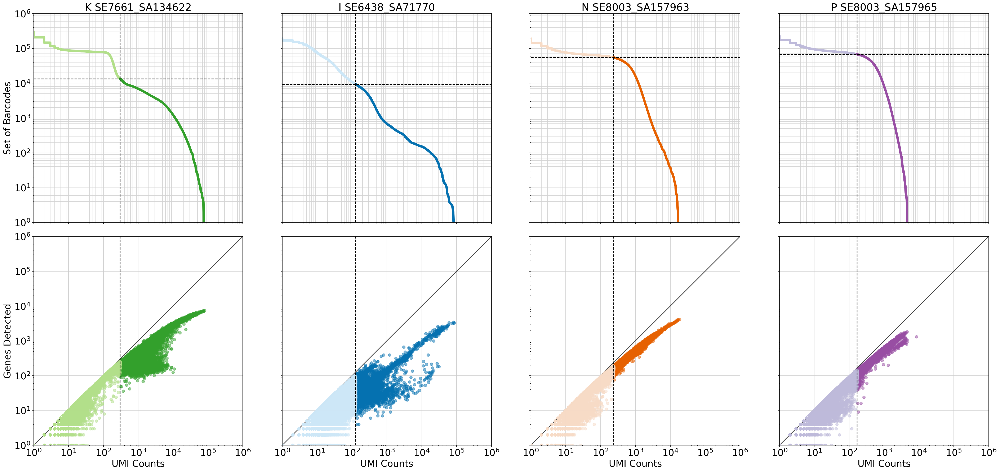

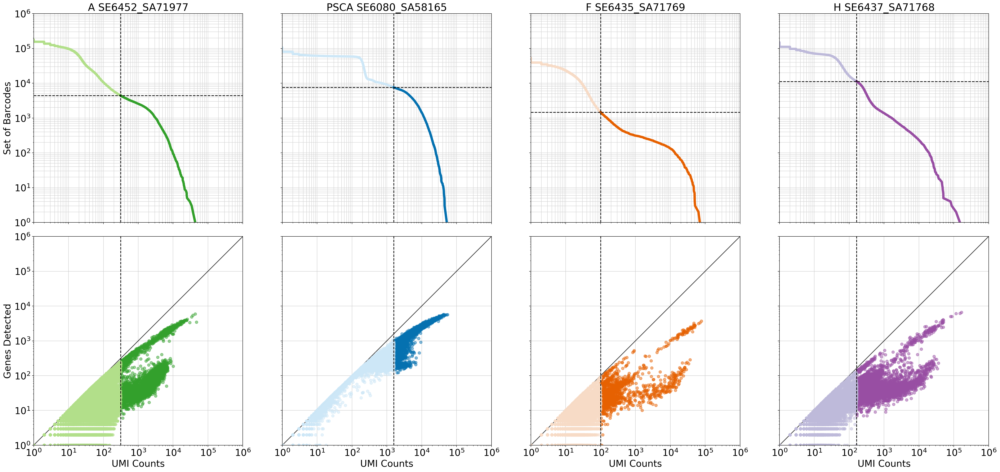

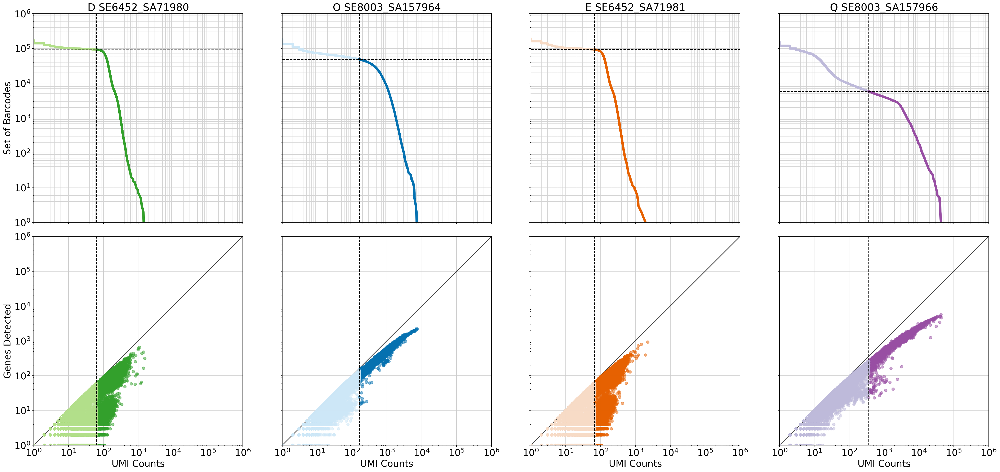

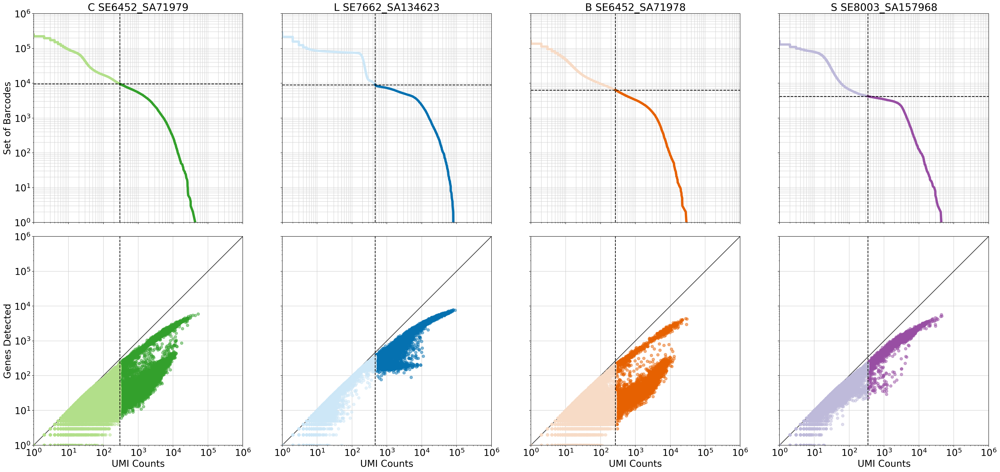

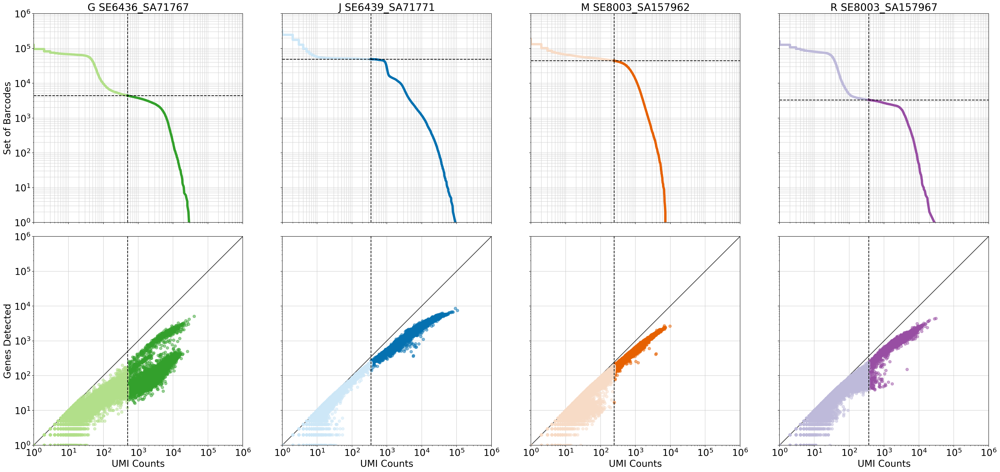

In [66]:
# Generate knee and library saturation plots for 4 datasets at a time
for split_idx, splits in enumerate([[0, 4], [4, 8], [8, 12], [12, 16], [16, 20]]):
    fig, axs = plt.subplots(
        figsize=(30, 14),
        ncols=4,
        nrows=2,
        sharex="col",
        sharey="row",
        constrained_layout=True,
    )
    axs_row1 = [axs[0][0], axs[0][1], axs[0][2], axs[0][3]]
    axs_row2 = [axs[1][0], axs[1][1], axs[1][2], axs[1][3]]
    
    # Plot knee plots in first row
    for ax, (i, adata) in zip(axs_row1, enumerate(adatas_raw[splits[0] : splits[1]])):

        # Set plot title
        title = adata.obs["sample"][0] + " " + adata.obs["library_id"][0]

        knee = np.sort((np.array(adata.X.sum(axis=1))).flatten())[::-1]

        # Create masks for cells that will be kept/filtered out based on minimum UMI count
        min_umi = knee[expected_num_cells[split_idx][i]]
        keep_mask = np.ma.masked_where(knee > min_umi, knee).mask
        filter_mask = np.invert(keep_mask)

        #     # Plot all cells in filter out color
        #     ax.loglog(knee, range(len(knee)), linewidth=5, color=filter_colors[i])
        #     # Overlay with cells to keep in dark color
        #     ax.loglog(knee[keep_mask], range(len(knee[keep_mask])), linewidth=5, color=colors[i])

        # Plot all cells in filter out color
        ax.plot(knee, range(len(knee)), linewidth=5, color=filter_colors[i])
        # Overlay with cells to keep in dark color
        ax.plot(
            knee[keep_mask], range(len(knee[keep_mask])), linewidth=5, color=colors[i]
        )
        ax.set_xscale("log")
        ax.set_yscale("log")

        # Add lines to show filtering cut offs
        ax.axvline(x=knee[expected_num_cells[split_idx][i]], linewidth=1.5, color="k", ls="--")
        ax.axhline(y=expected_num_cells[split_idx][i], linewidth=1.5, color="k", ls="--")

        # Define axis labels and title
        #     ax.set_xlabel("UMI Counts", fontsize=fontsize)
        if i == 0:
            ax.set_ylabel("Set of Barcodes", fontsize=fontsize)
        ax.set_title(title, fontsize=fontsize + 2)

        # Change fontsize of tick labels
        ax.tick_params(axis="both", labelsize=fontsize)

        # Set x and y lim to be the same as for the library sat plot
        ax.set_xlim(1, 10 ** 6)
        ax.set_ylim(1, 10 ** 6)

        # Add grid and set below graph
        ax.grid(True, which="both", color="lightgray")
        ax.set_axisbelow(True)

        # Add invisible linear graph to match square library sat plot
        yex(ax, alpha=0)

    # Plot library saturation plots in second row
    for ax, (i, adata) in zip(axs_row2, enumerate(adatas_raw[splits[0] : splits[1]])):
        # Number of UMI counts per cell
        x = np.asarray(adata.X.sum(axis=1))[:, 0]
        # Number of different genes detected per cell
        y = np.asarray(np.sum(adata.X > 0, axis=1))[:, 0]

        # Create masks for cells that will be kept/filtered out based on minimum UMI count from knee plot
        knee = np.sort((np.array(adata.X.sum(axis=1))).flatten())[::-1]
        min_umi = knee[expected_num_cells[split_idx][i]]
        keep_mask = np.ma.masked_where(x > min_umi, x).mask
        filter_mask = np.invert(keep_mask)

        ax.scatter(x[keep_mask], y[keep_mask], alpha=0.5, color=colors[i], zorder=2)
        ax.scatter(
            x[filter_mask], y[filter_mask], alpha=0.5, color=filter_colors[i], zorder=2
        )

        # Add lines to show filtering cut off
        ax.axvline(x=min_umi, linewidth=1.5, color="k", ls="--", zorder=3)

        ax.set_xscale("log")
        ax.set_yscale("log")

        # Define axis labels and title
        ax.set_xlabel("UMI Counts", fontsize=fontsize)
        if i == 0:
            ax.set_ylabel("Genes Detected", fontsize=fontsize)
        #     ax.set_title(title, fontsize=fontsize+2)

        # Change fontsize of tick labels
        ax.tick_params(axis="both", labelsize=fontsize)

        # Set x and y lim
        ax.set_xlim(1, 10 ** 6)
        ax.set_ylim(1, 10 ** 6)

        # Add grid and set below graph
        ax.set_axisbelow(True)

        # Add linear graph
        yex(ax)

    fig.savefig(
        f"figures/1_{str(splits[0])}-{str(splits[1])}_knee_+_library_sat_plots.png", dpi=300, bbox_inches="tight"
    )
    fig.savefig(
        f"figures/1_{str(splits[0])}-{str(splits[1])}_knee_+_library_sat_plots.svg", dpi=300, bbox_inches="tight"
    )
    
    fig.show()

### Check expression of mitochondrially encoded genes

In [16]:
for adata in adatas_raw:
    # Create copy of index in var
    adata.var["ensembl_ids"] = adata.var.index 
    
    # Remove version number from Ensembl IDs
    adata.var.index = adata.var.index.str.split(".").str[0]

In [17]:
# Get Ensembl IDs of homo sapiens MT genes
mito_ensembl_df = sc.queries.mitochondrial_genes("hsapiens", attrname="ensembl_gene_id")
# Only keep those occuring in our data
mito_gene_ids = list(set(mito_ensembl_df["ensembl_gene_id"].values)&set(adatas_raw[1].var.index))
mito_gene_ids

['ENSG00000210195',
 'ENSG00000210135',
 'ENSG00000198727',
 'ENSG00000210196',
 'ENSG00000210127',
 'ENSG00000210176',
 'ENSG00000209082',
 'ENSG00000198786',
 'ENSG00000198763',
 'ENSG00000198712',
 'ENSG00000210144',
 'ENSG00000211459',
 'ENSG00000210154',
 'ENSG00000228253',
 'ENSG00000210107',
 'ENSG00000210164',
 'ENSG00000198899',
 'ENSG00000210184',
 'ENSG00000210117',
 'ENSG00000210100',
 'ENSG00000212907',
 'ENSG00000210156',
 'ENSG00000210194',
 'ENSG00000210112',
 'ENSG00000198840',
 'ENSG00000198695',
 'ENSG00000198804',
 'ENSG00000210077',
 'ENSG00000210191',
 'ENSG00000210140',
 'ENSG00000210151',
 'ENSG00000210174',
 'ENSG00000210082',
 'ENSG00000210049',
 'ENSG00000198888',
 'ENSG00000198938',
 'ENSG00000198886']

Sample K - Maximum total UMI count for all mitochondrially encoded genes in one cell: 19933.0.


/tmp/ipykernel_39868/3868530266.py:23: RuntimeWarning: invalid value encountered in divide
  total_mito_perc = total_mito_exp / adata.X.sum(axis=1).A1


Sample I - Maximum total UMI count for all mitochondrially encoded genes in one cell: 15963.0.
Sample N - Maximum total UMI count for all mitochondrially encoded genes in one cell: 1317.0.
Sample P - Maximum total UMI count for all mitochondrially encoded genes in one cell: 5939.0.
Sample A - Maximum total UMI count for all mitochondrially encoded genes in one cell: 4303.0.
Sample PSCA - Maximum total UMI count for all mitochondrially encoded genes in one cell: 8215.0.
Sample F - Maximum total UMI count for all mitochondrially encoded genes in one cell: 6801.0.
Sample H - Maximum total UMI count for all mitochondrially encoded genes in one cell: 25599.0.
Sample D - Maximum total UMI count for all mitochondrially encoded genes in one cell: 1090.0.
Sample O - Maximum total UMI count for all mitochondrially encoded genes in one cell: 983.0.
Sample E - Maximum total UMI count for all mitochondrially encoded genes in one cell: 458.0.
Sample Q - Maximum total UMI count for all mitochondriall

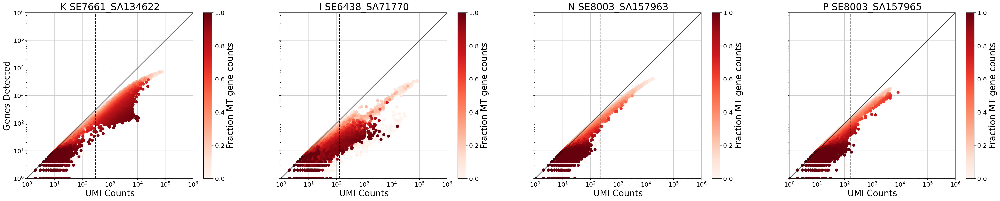

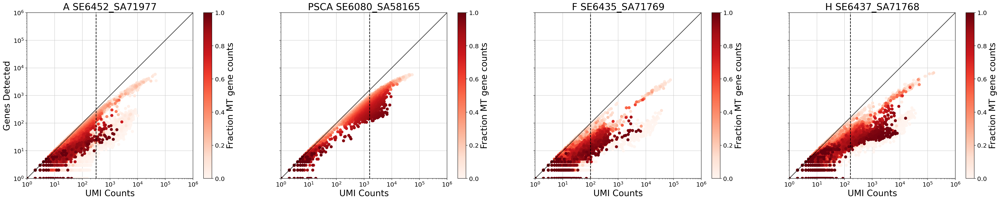

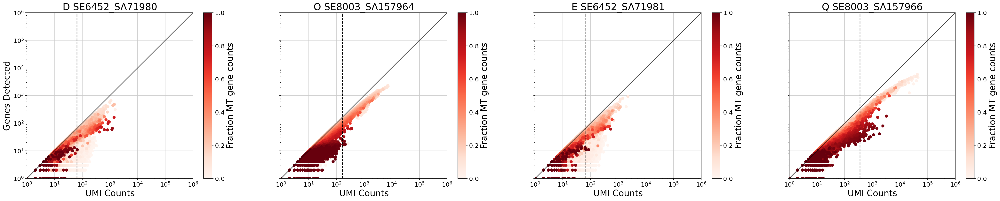

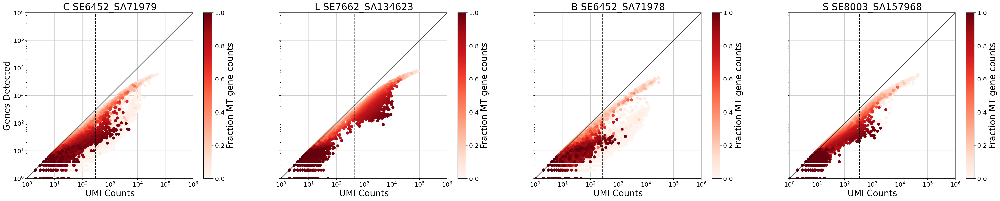

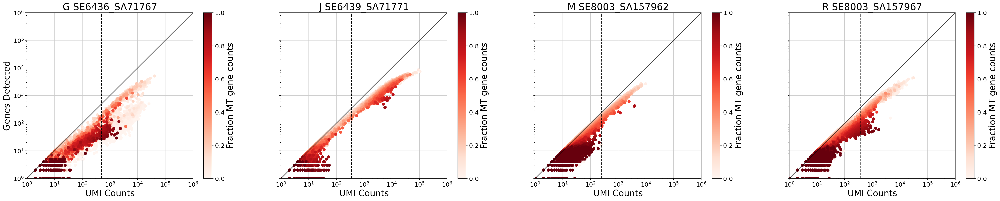

In [18]:
# Generate mito library saturation plots for 4 datasets at a time
for split_idx, splits in enumerate([[0, 4], [4, 8], [8, 12], [12, 16], [16, 20]]):
    
    fig, axs = plt.subplots(figsize=(40,7), ncols=4, sharey=True)

    for ax,(i, adata) in zip(axs, enumerate(adatas_raw[splits[0] : splits[1]])):
        # Set plot title
        title = adata.obs["sample"][0] + " " + adata.obs["library_id"][0]

        # Calculate the sum counts of all mito genes per cell
        total_mito_exp = []
        for idx, gene in enumerate(mito_gene_ids):
            gene_exp = nd(adata[:, adata.var.index.str.contains(gene)].X.todense())
            if idx == 0:
                total_mito_exp = gene_exp
            else:
                # Add the expression of this mito gene to the list
                total_mito_exp = total_mito_exp + gene_exp

        print(f"Sample {adata.obs['sample'][0]} - Maximum total UMI count for all mitochondrially encoded genes in one cell: {total_mito_exp.max()}.")

        # Calculate the fraction of MT counts / total UMI counts per cell
        total_mito_perc = total_mito_exp / adata.X.sum(axis=1).A1

        x = nd(adata.X.sum(1))
        y = nd((adata.X>0).sum(1))
        c = total_mito_perc
        idx = c.argsort()
        x2, y2, c2 = x[idx], y[idx], c[idx]
        scatter = ax.scatter(x2, y2, c=c2, cmap="Reds")

        # Add a colorbar legend
        cb = fig.colorbar(scatter, ax=ax)
        cb.set_label(label="Fraction MT gene counts", fontsize=fontsize)

        # Add lines to show filtering cut off
        knee = np.sort((np.array(adata.X.sum(axis=1))).flatten())[::-1]
        min_umi = knee[expected_num_cells[split_idx][i]]
        ax.axvline(x=min_umi, linewidth=1.5, color="k", ls="--", zorder=3)   

        ax.set_xscale('log')
        ax.set_yscale('log')
        ax.set_xlabel("UMI Counts", fontsize=fontsize)
        if i == 0:
            ax.set_ylabel("Genes Detected", fontsize=fontsize)
        ax.set_xlim(1, 10**6)
        ax.set_ylim(1, 10**6)
        ax.set_title(title, fontsize=fontsize+2)
        yex(ax)
        ax.set_axisbelow(True)

    fig.savefig(f"figures/1_{str(splits[0])}-{str(splits[1])}_library_sat_mito_perc.png", dpi=300, bbox_inches='tight')  

    fig.show()

In [19]:
# Define max. mito percentage
mito_filter = 0.2

/tmp/ipykernel_39868/1263716576.py:10: RuntimeWarning: invalid value encountered in divide
  adata.obs['percent_mito'] = np.sum(adata[:, mito_gene_ids].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
/tmp/ipykernel_39868/1263716576.py:10: RuntimeWarning: invalid value encountered in divide
  adata.obs['percent_mito'] = np.sum(adata[:, mito_gene_ids].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
/tmp/ipykernel_39868/1263716576.py:10: RuntimeWarning: invalid value encountered in divide
  adata.obs['percent_mito'] = np.sum(adata[:, mito_gene_ids].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
/tmp/ipykernel_39868/1263716576.py:10: RuntimeWarning: invalid value encountered in divide
  adata.obs['percent_mito'] = np.sum(adata[:, mito_gene_ids].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
/tmp/ipykernel_39868/1263716576.py:10: RuntimeWarning: invalid value encountered in divide
  adata.obs['percent_mito'] = np.sum(adata[:, mito_gene_ids].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
/tmp/ipykernel_39868/1263

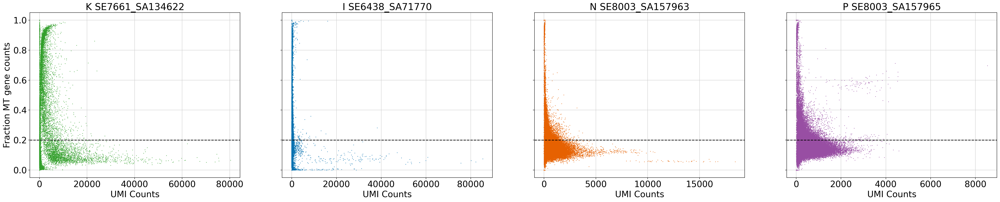

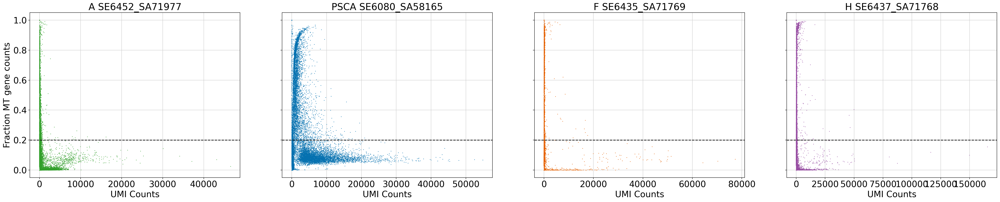

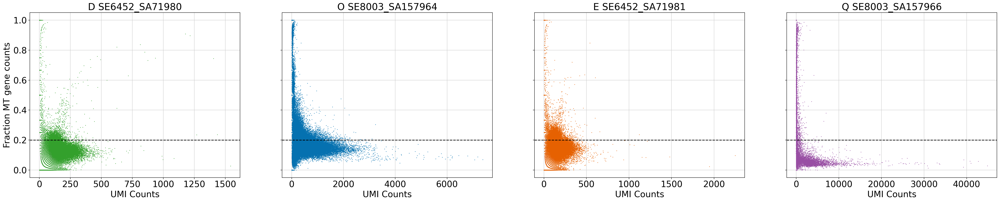

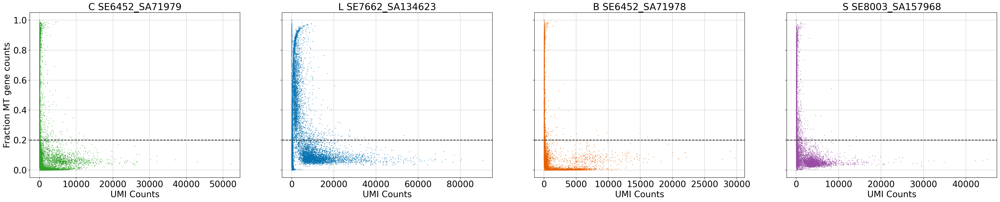

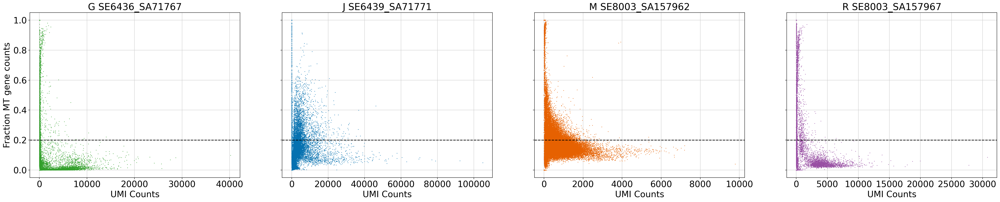

In [20]:
# Generate mito library saturation plots for 4 datasets at a time
for splits in [[0, 4], [4, 8], [8, 12], [12, 16], [16, 20]]:
    
    fig, axs = plt.subplots(figsize=(40,7), ncols=4, sharey=True)

    for ax,(i, adata) in zip(axs, enumerate(adatas_raw[splits[0] : splits[1]])):
        # Set plot title
        title = adata.obs["sample"][0] + " " + adata.obs["library_id"][0]
        
        adata.obs['percent_mito'] = np.sum(adata[:, mito_gene_ids].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
        # Add the total UMI counts per cell as observations-annotation to adata
        adata.obs['n_counts'] = adata.X.sum(axis=1).A1

        ax.scatter(adata.obs["n_counts"].values, adata.obs["percent_mito"].values, color=colors[i], s=0.2)

        # Define axis labels and title
        ax.set_xlabel("UMI Counts", fontsize=fontsize)
        if i ==0:
            ax.set_ylabel("Fraction MT gene counts", fontsize=fontsize)
        ax.set_title(title, fontsize=fontsize+2)

        # Change fontsize of tick labels
        ax.tick_params(axis='both', labelsize=fontsize)

        # # Add lines to show filtering cut off
        # knee = np.sort((np.array(adata.X.sum(axis=1))).flatten())[::-1]
        # min_umi = knee[expected_num_cells[i]]
        # ax.axvline(x=min_umi, linewidth=1.5, color="k", ls="--", zorder=3) 

        ax.axhline(y=mito_filter, linewidth=1.5, color="k", ls="--", zorder=3) 

        # Add grid and set below graph
        ax.set_axisbelow(True)

        # fig.savefig(f"figures/1_{str(splits[0])}-{str(splits[1])}_mito_perc_UMI_counts.png", dpi=300, bbox_inches='tight') 

Overlay library saturation plot with CAR expression:

In [21]:
# for split_idx, splits in enumerate([[0, 4], [4, 8], [8, 12], [12, 16], [16, 20]]):
    
#     fig, axs = plt.subplots(figsize=(40,7), ncols=4, sharey=True)

#     for ax,(i, adata) in zip(axs, enumerate(adatas_raw[splits[0] : splits[1]])):
#         # Set plot title
#         title = adata.obs["sample"][0] + " " + adata.obs["library_id"][0]

#         # Calculate the sum count per cell
#         total_exp = nd(adata[:, adata.var.index.str.contains("CAR")].X.todense())

#         x = nd(adata.X.sum(1))
#         y = nd((adata.X>0).sum(1))
#         c = total_exp
#         idx = c.argsort()
#         x2, y2, c2 = x[idx], y[idx], c[idx]
#         scatter = ax.scatter(x2, y2, c=c2, cmap="Blues")

#         # Add a colorbar legend
#         cb = fig.colorbar(scatter, ax=ax)
#         cb.set_label(label="CAR sequence counts", fontsize=fontsize)

#         # Add lines to show filtering cut off
#         knee = np.sort((np.array(adata.X.sum(axis=1))).flatten())[::-1]
#         min_umi = knee[expected_num_cells[split_idx][i]]
#         ax.axvline(x=min_umi, linewidth=1.5, color="k", ls="--", zorder=3)   

#         ax.set_xscale('log')
#         ax.set_yscale('log')
#         ax.set_xlabel("UMI Counts", fontsize=fontsize)
#         if i == 0:
#             ax.set_ylabel("Genes Detected", fontsize=fontsize)
#         ax.set_xlim(1, 10**6)
#         ax.set_ylim(1, 10**6)
#         ax.set_title(title, fontsize=fontsize+2)
#         yex(ax)
#         ax.set_axisbelow(True)

#     fig.savefig(f"figures/1_{str(splits[0])}-{str(splits[1])}_library_sat_CAR.png", dpi=300, bbox_inches='tight')  

#     fig.show()

### Filter cells based on minimum number of UMI counts from knee plot, fraction of mitochondrially encoded genes, and minimum number of genes:

In [22]:
# Minimum number of genes per cell
min_genes = 100

In [23]:
def flatten(l):
    """
    Flatten a list of lists.
    """
    return [item for sublist in l for item in sublist]

In [24]:
flatten(expected_num_cells)

[13481,
 9282,
 55263,
 67767,
 4419,
 7611,
 1466,
 11264,
 92167,
 48303,
 92491,
 5827,
 9568,
 9008,
 6336,
 4216,
 4421,
 49104,
 44337,
 3318]

In [25]:
# List to save filtered adata objects
adatas = []

for i, adata in enumerate(adatas_raw):
    knee = np.sort((np.array(adata.X.sum(axis=1))).flatten())[::-1]
    min_umi = knee[flatten(expected_num_cells)[i]]
    print(f"Sample {adata.obs['sample'][0]} minimum number of UMI counts based on the knee plot: {min_umi}")
    print(f"Sample {adata.obs['sample'][0]} mean UMI count per cell: {adata.X.sum(axis=1).mean()}")
    print(f"Sample {adata.obs['sample'][0]} max UMI count in one cell: {adata.X.sum(axis=1).max()}")
    print(f"Sample {adata.obs['sample'][0]} total UMI count: {adata.X.sum()}")

    # Remove cells with less than [min_umi] UMI counts
    adata = adata[np.asarray(adata.X.sum(axis=1)).reshape(-1) > min_umi]
    
    ## Filter out cells with a mito percentage > mito_filter
    # `.A1` transforms sparse array X to a dense array after summing
    adata.obs['percent_mito'] = np.sum(adata[:, mito_gene_ids].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
    adata = adata[adata.obs.percent_mito < mito_filter]
    
    ## Filter for a minimum number of genes
    sc.pp.filter_cells(adata, min_genes=min_genes)
    
    print(f"Sample {adata.obs['sample'][0]} mean UMI count per cell (after filtering): {adata.X.sum(axis=1).mean()}")
    
    adatas.append(adata)
    
    print(adata)

Sample K minimum number of UMI counts based on the knee plot: 301.0
Sample K mean UMI count per cell: 190.21640014648438
Sample K max UMI count in one cell: 80343.0
Sample K total UMI count: 59459552.0
Sample K mean UMI count per cell (after filtering): 4579.36181640625
AnnData object with n_obs × n_vars = 7287 × 61861
    obs: 'species', 'tissue', 'library_id', 'sample', 'percent_mito', 'n_counts', 'n_genes'
    var: 'gene_name', 'ensembl_ids'
    layers: 'spliced', 'unspliced'
Sample I minimum number of UMI counts based on the knee plot: 128.0
Sample I mean UMI count per cell: 52.15351486206055
Sample I max UMI count in one cell: 85385.0
Sample I total UMI count: 10817108.0
Sample I mean UMI count per cell (after filtering): 6740.09912109375
AnnData object with n_obs × n_vars = 707 × 61861
    obs: 'species', 'tissue', 'library_id', 'sample', 'percent_mito', 'n_counts', 'n_genes'
    var: 'gene_name', 'ensembl_ids'
    layers: 'spliced', 'unspliced'
Sample N minimum number of UMI cou

___

# Add patient/donor information

In [ ]:
# First round of Vireo demultiplexing
datasets_id_mapping = glob.glob("../COH_data/filtered_barcodes/*/patient_mapping/*_donor_ids.csv")

In [27]:
for adata in adatas:
    # Add copy of barcode index as column
    adata.obs['barcode_copy'] = adata.obs.index
    
    print(adata.obs['tissue'][0] + "_" + adata.obs['sample'][0] + "_" + adata.obs['library_id'][0])
    # Find filepath to barcode-donor mapping returned by Vireo
    for dataset in datasets_id_mapping:
        if f"_{adata.obs['tissue'][0]}_" in dataset and f"_{adata.obs['sample'][0]}_" in dataset and f"_{adata.obs['library_id'][0]}_" in dataset:
            id_map = pd.read_csv(dataset)
            print(dataset)
    
    # Add donor IDs to AnnData object
    adata.obs = (
            adata
            .obs.merge(id_map, left_on="barcode", right_on="cell_barcode", how="left", validate="one_to_one")
            .set_index("barcode_copy")
        )

CART_K_SE7661_SA134622
/home/laura/projects/COH_data/filtered_barcodes/CART/patient_mapping/UPN454_455_504_CART_K_X5SCR_SE7661_SA134622_donor_ids.csv
PB_I_SE6438_SA71770
/home/laura/projects/COH_data/filtered_barcodes/PB/patient_mapping/UPN388_406_PB_I_X5SCR_SE6438_SA71770_donor_ids.csv
PB_N_SE8003_SA157963
/home/laura/projects/COH_data/filtered_barcodes/PB/patient_mapping/UPN375_388_PB_N_X5SCR_SE8003_SA157963_donor_ids.csv
PB_P_SE8003_SA157965
/home/laura/projects/COH_data/filtered_barcodes/PB/patient_mapping/UPN388_394_PB_P_X5SCR_SE8003_SA157965_donor_ids.csv
PB_A_SE6452_SA71977
/home/laura/projects/COH_data/filtered_barcodes/PB/patient_mapping/UPN375_376_393_PB_A_X5SCR_SE6452_SA71977_donor_ids.csv
CART_PSCA_SE6080_SA58165
/home/laura/projects/COH_data/filtered_barcodes/CART/patient_mapping/UPN375_376_388_393_PSCA_CART_X5SCR_SE6080_SA58165_donor_ids.csv
PB_F_SE6435_SA71769
/home/laura/projects/COH_data/filtered_barcodes/PB/patient_mapping/UPN376_393_406_PB_F_X5SCR_SE6435_SA71769_dono

In [28]:
# # Save barcodes without mapping to be run in Verio
# for adata in adatas:
#     barcodes = adata.obs[adata.obs["cell_barcode"].isna()].index.values
    
#     with open(f"../COH_data/alignment_v2/verio_bcs_{adata.obs['tissue'].values[0]}_{adata.obs['sample'].values[0]}_{adata.obs['library_id'].values[0]}.txt", "w") as output:
#         for barcode in barcodes:
#             output.write(barcode + "\n")

In [29]:
# Second round of Vireo demultiplexing
datasets_id_mapping2 = glob.glob("../COH_data/alignment_v2/patient_mapping/*_donor_ids.csv")
datasets_id_mapping2

['/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN393_403_406_PB_D_X5SCR_SE6452_SA71980_donor_ids.csv',
 '/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN376_388_406_PB_E_X5SCR_SE6452_SA71981_donor_ids.csv',
 '/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN375_403_406_PB_G_X5SCR_SE6436_SA71767_donor_ids.csv',
 '/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN454_455_504_CART_K_X5SCR_SE7661_SA134622_donor_ids.csv',
 '/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN388_394_PB_P_X5SCR_SE8003_SA157965_donor_ids.csv',
 '/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN375_388_393_PB_B_X5SCR_SE6452_SA71978_donor_ids.csv',
 '/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN375_388_PB_N_X5SCR_SE8003_SA157963_donor_ids.csv',
 '/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN388_394_PB_M_X5SCR_SE8003_SA157962_donor_ids.csv',
 '/home/laura/projects/COH_data/alignment_v2/patient_mapping/U

In [30]:
adatas[0].obs

,species,tissue,library_id,sample,percent_mito,n_counts,n_genes,cell_barcode,donor_id
barcode_copy,,,,,,,,,
AAACCTGAGCAATCTC,homo_sapiens,CART,SE7661_SA134622,K,0.071907,17328.0,4051,AAACCTGAGCAATCTC,504
AAACCTGAGCGATATA,homo_sapiens,CART,SE7661_SA134622,K,0.016605,542.0,396,AAACCTGAGCGATATA,doublet
AAACCTGAGGGCTCTC,homo_sapiens,CART,SE7661_SA134622,K,0.013453,446.0,348,AAACCTGAGGGCTCTC,doublet
AAACCTGCAAACGCGA,homo_sapiens,CART,SE7661_SA134622,K,0.051576,349.0,268,NaN,NaN
AAACCTGCACAGGCCT,homo_sapiens,CART,SE7661_SA134622,K,0.047619,420.0,302,AAACCTGCACAGGCCT,doublet
...,...,...,...,...,...,...,...,...,...
TTTGTCATCACAAACC,homo_sapiens,CART,SE7661_SA134622,K,0.048387,310.0,237,NaN,NaN
TTTGTCATCCATGAGT,homo_sapiens,CART,SE7661_SA134622,K,0.156340,8699.0,2902,TTTGTCATCCATGAGT,454
TTTGTCATCTACTATC,homo_sapiens,CART,SE7661_SA134622,K,0.058411,428.0,303,NaN,NaN


In [31]:
for adata in adatas:
    # Add copy of barcode index as column
    adata.obs['barcode'] = adata.obs.index
    
    print(adata.obs['tissue'][0] + "_" + adata.obs['sample'][0] + "_" + adata.obs['library_id'][0])
    
    # Find filepath to barcode-donor mapping returned by Vireo
    id_map = None
    for dataset in datasets_id_mapping2:
        if f"_{adata.obs['tissue'][0]}_" in dataset and f"_{adata.obs['sample'][0]}_" in dataset and f"_{adata.obs['library_id'][0]}_" in dataset:
            id_map = pd.read_csv(dataset)
            print(dataset)
    
    if id_map is None:
        adata.obs["donor"] = adata.obs["donor_id"]
        continue
        
    # Add donor IDs to AnnData object
    adata.obs = (
            adata
            .obs.merge(id_map, left_on="barcode", right_on="cell_barcode", how="left", validate="one_to_one")
            .set_index("barcode")
        )
    
    adata.obs['cell_barcode'] = adata.obs['cell_barcode_x'].combine_first(adata.obs['cell_barcode_y'])
    adata.obs['donor'] = adata.obs['donor_id_x'].combine_first(adata.obs['donor_id_y'])

CART_K_SE7661_SA134622
/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN454_455_504_CART_K_X5SCR_SE7661_SA134622_donor_ids.csv
PB_I_SE6438_SA71770
/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN388_406_PB_I_X5SCR_SE6438_SA71770_donor_ids.csv
PB_N_SE8003_SA157963
/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN375_388_PB_N_X5SCR_SE8003_SA157963_donor_ids.csv
PB_P_SE8003_SA157965
/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN388_394_PB_P_X5SCR_SE8003_SA157965_donor_ids.csv
PB_A_SE6452_SA71977
/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN375_376_393_PB_A_X5SCR_SE6452_SA71977_donor_ids.csv
CART_PSCA_SE6080_SA58165
PB_F_SE6435_SA71769
PB_H_SE6437_SA71768
PB_D_SE6452_SA71980
/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN393_403_406_PB_D_X5SCR_SE6452_SA71980_donor_ids.csv
PB_O_SE8003_SA157964
/home/laura/projects/COH_data/alignment_v2/patient_mapping/UPN375_388_PB_O_X5SCR_SE8003_SA157964_donor_ids.csv
P

In [32]:
adatas[0].obs

,species,tissue,library_id,sample,percent_mito,n_counts,n_genes,cell_barcode_x,donor_id_x,cell_barcode_y,donor_id_y,cell_barcode,donor
barcode,,,,,,,,,,,,,
AAACCTGAGCAATCTC,homo_sapiens,CART,SE7661_SA134622,K,0.071907,17328.0,4051,AAACCTGAGCAATCTC,504,NaN,NaN,AAACCTGAGCAATCTC,504
AAACCTGAGCGATATA,homo_sapiens,CART,SE7661_SA134622,K,0.016605,542.0,396,AAACCTGAGCGATATA,doublet,NaN,NaN,AAACCTGAGCGATATA,doublet
AAACCTGAGGGCTCTC,homo_sapiens,CART,SE7661_SA134622,K,0.013453,446.0,348,AAACCTGAGGGCTCTC,doublet,NaN,NaN,AAACCTGAGGGCTCTC,doublet
AAACCTGCAAACGCGA,homo_sapiens,CART,SE7661_SA134622,K,0.051576,349.0,268,NaN,NaN,AAACCTGCAAACGCGA,unassigned,AAACCTGCAAACGCGA,unassigned
AAACCTGCACAGGCCT,homo_sapiens,CART,SE7661_SA134622,K,0.047619,420.0,302,AAACCTGCACAGGCCT,doublet,NaN,NaN,AAACCTGCACAGGCCT,doublet
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCACAAACC,homo_sapiens,CART,SE7661_SA134622,K,0.048387,310.0,237,NaN,NaN,TTTGTCATCACAAACC,504,TTTGTCATCACAAACC,504
TTTGTCATCCATGAGT,homo_sapiens,CART,SE7661_SA134622,K,0.156340,8699.0,2902,TTTGTCATCCATGAGT,454,NaN,NaN,TTTGTCATCCATGAGT,454
TTTGTCATCTACTATC,homo_sapiens,CART,SE7661_SA134622,K,0.058411,428.0,303,NaN,NaN,TTTGTCATCTACTATC,unassigned,TTTGTCATCTACTATC,unassigned


In [33]:
adatas[-1].obs

,species,tissue,library_id,sample,percent_mito,n_counts,n_genes,cell_barcode,donor_id,barcode,donor
barcode_copy,,,,,,,,,,,
AAACCTGAGAACAATC,homo_sapiens,PB,SE8003_SA157967,R,0.047752,4314.0,1582,AAACCTGAGAACAATC,375,AAACCTGAGAACAATC,375
AAACCTGAGAGTACAT,homo_sapiens,PB,SE8003_SA157967,R,0.034919,4267.0,1189,AAACCTGAGAGTACAT,375,AAACCTGAGAGTACAT,375
AAACCTGAGCGCTTAT,homo_sapiens,PB,SE8003_SA157967,R,0.022604,3141.0,1143,AAACCTGAGCGCTTAT,375,AAACCTGAGCGCTTAT,375
AAACCTGAGTCCCACG,homo_sapiens,PB,SE8003_SA157967,R,0.165934,910.0,461,AAACCTGAGTCCCACG,375,AAACCTGAGTCCCACG,375
AAACCTGGTTCCACGG,homo_sapiens,PB,SE8003_SA157967,R,0.040645,5954.0,1637,AAACCTGGTTCCACGG,394,AAACCTGGTTCCACGG,394
...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCTATCCTA,homo_sapiens,PB,SE8003_SA157967,R,0.081861,2321.0,1256,TTTGGTTTCTATCCTA,375,TTTGGTTTCTATCCTA,375
TTTGTCACATTACCTT,homo_sapiens,PB,SE8003_SA157967,R,0.112755,2501.0,1197,TTTGTCACATTACCTT,375,TTTGTCACATTACCTT,375
TTTGTCAGTAGCTTGT,homo_sapiens,PB,SE8003_SA157967,R,0.039920,3983.0,1394,TTTGTCAGTAGCTTGT,394,TTTGTCAGTAGCTTGT,394


___

# Concatenate adata objects

In [34]:
adata = anndata.concat(adatas, join="outer")
adata

AnnData object with n_obs × n_vars = 274831 × 61861
    obs: 'species', 'tissue', 'library_id', 'sample', 'percent_mito', 'n_counts', 'n_genes', 'cell_barcode_x', 'donor_id_x', 'cell_barcode_y', 'donor_id_y', 'cell_barcode', 'donor', 'donor_id', 'barcode'
    layers: 'spliced', 'unspliced'

In [35]:
adata.obs

,species,tissue,library_id,sample,percent_mito,n_counts,n_genes,cell_barcode_x,donor_id_x,cell_barcode_y,donor_id_y,cell_barcode,donor,donor_id,barcode
AAACCTGAGCAATCTC,homo_sapiens,CART,SE7661_SA134622,K,0.071907,17328.0,4051,AAACCTGAGCAATCTC,504,NaN,NaN,AAACCTGAGCAATCTC,504,NaN,NaN
AAACCTGAGCGATATA,homo_sapiens,CART,SE7661_SA134622,K,0.016605,542.0,396,AAACCTGAGCGATATA,doublet,NaN,NaN,AAACCTGAGCGATATA,doublet,NaN,NaN
AAACCTGAGGGCTCTC,homo_sapiens,CART,SE7661_SA134622,K,0.013453,446.0,348,AAACCTGAGGGCTCTC,doublet,NaN,NaN,AAACCTGAGGGCTCTC,doublet,NaN,NaN
AAACCTGCAAACGCGA,homo_sapiens,CART,SE7661_SA134622,K,0.051576,349.0,268,NaN,NaN,AAACCTGCAAACGCGA,unassigned,AAACCTGCAAACGCGA,unassigned,NaN,NaN
AAACCTGCACAGGCCT,homo_sapiens,CART,SE7661_SA134622,K,0.047619,420.0,302,AAACCTGCACAGGCCT,doublet,NaN,NaN,AAACCTGCACAGGCCT,doublet,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCTATCCTA,homo_sapiens,PB,SE8003_SA157967,R,0.081861,2321.0,1256,NaN,NaN,NaN,NaN,TTTGGTTTCTATCCTA,375,375,TTTGGTTTCTATCCTA
TTTGTCACATTACCTT,homo_sapiens,PB,SE8003_SA157967,R,0.112755,2501.0,1197,NaN,NaN,NaN,NaN,TTTGTCACATTACCTT,375,375,TTTGTCACATTACCTT
TTTGTCAGTAGCTTGT,homo_sapiens,PB,SE8003_SA157967,R,0.039920,3983.0,1394,NaN,NaN,NaN,NaN,TTTGTCAGTAGCTTGT,394,394,TTTGTCAGTAGCTTGT
TTTGTCAGTTCAGACT,homo_sapiens,PB,SE8003_SA157967,R,0.040701,3538.0,1489,NaN,NaN,NaN,NaN,TTTGTCAGTTCAGACT,375,375,TTTGTCAGTTCAGACT


# Filter out genes that are only present in less than n cells

In [36]:
# Minimum number of cells a gene needs to be expressed in
min_cells = 3

In [37]:
sc.pp.filter_genes(adata, min_cells=min_cells)

Visualize number of genes expressed, UMI counts, and mito percentage per cell after filtering:

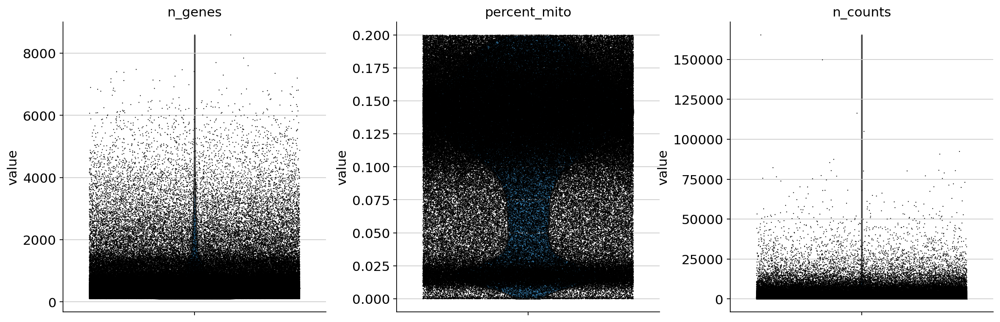

In [38]:
sc.pl.violin(adata, ['n_genes', 'percent_mito', 'n_counts'], jitter=0.4, multi_panel=True)

___

# Add timepoint metadata

In [39]:
metadata = pd.read_csv("../COH/IRB17483_metadata.csv")

Only keep PB data from NovaSeqS4:

In [40]:
pb_metadata = metadata[(metadata["tissue_type"]=="PB") & (metadata["sequencing_platform"]=="NovaSeqS4")]

# Convert timepoint data to integer
pb_metadata["timepoint"] = pb_metadata["timepoint"].astype(int)

pb_metadata

/tmp/ipykernel_39868/734949133.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pb_metadata["timepoint"] = pb_metadata["timepoint"].astype(int)


,upn,timepoint,tissue_type,sample_name,library_id,flowcell_id,sequencing_platform,library_type
24,375,0,PB,PB_A,SE6452_SA71977,HJNN2DSXY,NovaSeqS4,X5SCR
25,376,1,PB,PB_A,SE6452_SA71977,HJNN2DSXY,NovaSeqS4,X5SCR
26,393,14,PB,PB_A,SE6452_SA71977,HJNN2DSXY,NovaSeqS4,X5SCR
30,375,1,PB,PB_B,SE6452_SA71978,HJNN2DSXY,NovaSeqS4,X5SCR
31,393,25,PB,PB_B,SE6452_SA71978,HJNN2DSXY,NovaSeqS4,X5SCR
32,388,14,PB,PB_B,SE6452_SA71978,HJNN2DSXY,NovaSeqS4,X5SCR
36,376,0,PB,PB_C,SE6452_SA71979,HJNN2DSXY,NovaSeqS4,X5SCR
37,388,28,PB,PB_C,SE6452_SA71979,HJNN2DSXY,NovaSeqS4,X5SCR
38,403,14,PB,PB_C,SE6452_SA71979,HJNN2DSXY,NovaSeqS4,X5SCR
42,393,0,PB,PB_D,SE6452_SA71980,HJNN2DSXY,NovaSeqS4,X5SCR


In [41]:
adata.obs

,species,tissue,library_id,sample,percent_mito,n_counts,n_genes,cell_barcode_x,donor_id_x,cell_barcode_y,donor_id_y,cell_barcode,donor,donor_id,barcode
AAACCTGAGCAATCTC,homo_sapiens,CART,SE7661_SA134622,K,0.071907,17328.0,4051,AAACCTGAGCAATCTC,504,NaN,NaN,AAACCTGAGCAATCTC,504,NaN,NaN
AAACCTGAGCGATATA,homo_sapiens,CART,SE7661_SA134622,K,0.016605,542.0,396,AAACCTGAGCGATATA,doublet,NaN,NaN,AAACCTGAGCGATATA,doublet,NaN,NaN
AAACCTGAGGGCTCTC,homo_sapiens,CART,SE7661_SA134622,K,0.013453,446.0,348,AAACCTGAGGGCTCTC,doublet,NaN,NaN,AAACCTGAGGGCTCTC,doublet,NaN,NaN
AAACCTGCAAACGCGA,homo_sapiens,CART,SE7661_SA134622,K,0.051576,349.0,268,NaN,NaN,AAACCTGCAAACGCGA,unassigned,AAACCTGCAAACGCGA,unassigned,NaN,NaN
AAACCTGCACAGGCCT,homo_sapiens,CART,SE7661_SA134622,K,0.047619,420.0,302,AAACCTGCACAGGCCT,doublet,NaN,NaN,AAACCTGCACAGGCCT,doublet,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCTATCCTA,homo_sapiens,PB,SE8003_SA157967,R,0.081861,2321.0,1256,NaN,NaN,NaN,NaN,TTTGGTTTCTATCCTA,375,375,TTTGGTTTCTATCCTA
TTTGTCACATTACCTT,homo_sapiens,PB,SE8003_SA157967,R,0.112755,2501.0,1197,NaN,NaN,NaN,NaN,TTTGTCACATTACCTT,375,375,TTTGTCACATTACCTT
TTTGTCAGTAGCTTGT,homo_sapiens,PB,SE8003_SA157967,R,0.039920,3983.0,1394,NaN,NaN,NaN,NaN,TTTGTCAGTAGCTTGT,394,394,TTTGTCAGTAGCTTGT
TTTGTCAGTTCAGACT,homo_sapiens,PB,SE8003_SA157967,R,0.040701,3538.0,1489,NaN,NaN,NaN,NaN,TTTGTCAGTTCAGACT,375,375,TTTGTCAGTTCAGACT


In [42]:
# Convert donor and sample columns in adata to strings
adata.obs["library_id"] = adata.obs["library_id"].astype(str)
adata.obs["sample"] = adata.obs["sample"].astype(str)

# Add new timepoint column to adata (PB data will be overwritten, leaving only "CART" data with the "IP" timepoint label)
adata.obs["timepoint"] = "IP"

# Add time points based on sample and donor IDs from metadata
for index in np.arange(len(pb_metadata)):
    sample = pb_metadata.iloc[index]["sample_name"].split("_")[1]
    donor = pb_metadata.iloc[index]["upn"]
    timepoint = pb_metadata.iloc[index]["timepoint"]

    adata.obs.loc[(adata.obs["sample"]==str(sample))&(adata.obs["donor"]==str(donor)), "timepoint"] = timepoint

In [43]:
adata.obs

,species,tissue,library_id,sample,percent_mito,n_counts,n_genes,cell_barcode_x,donor_id_x,cell_barcode_y,donor_id_y,cell_barcode,donor,donor_id,barcode,timepoint
AAACCTGAGCAATCTC,homo_sapiens,CART,SE7661_SA134622,K,0.071907,17328.0,4051,AAACCTGAGCAATCTC,504,NaN,NaN,AAACCTGAGCAATCTC,504,NaN,NaN,IP
AAACCTGAGCGATATA,homo_sapiens,CART,SE7661_SA134622,K,0.016605,542.0,396,AAACCTGAGCGATATA,doublet,NaN,NaN,AAACCTGAGCGATATA,doublet,NaN,NaN,IP
AAACCTGAGGGCTCTC,homo_sapiens,CART,SE7661_SA134622,K,0.013453,446.0,348,AAACCTGAGGGCTCTC,doublet,NaN,NaN,AAACCTGAGGGCTCTC,doublet,NaN,NaN,IP
AAACCTGCAAACGCGA,homo_sapiens,CART,SE7661_SA134622,K,0.051576,349.0,268,NaN,NaN,AAACCTGCAAACGCGA,unassigned,AAACCTGCAAACGCGA,unassigned,NaN,NaN,IP
AAACCTGCACAGGCCT,homo_sapiens,CART,SE7661_SA134622,K,0.047619,420.0,302,AAACCTGCACAGGCCT,doublet,NaN,NaN,AAACCTGCACAGGCCT,doublet,NaN,NaN,IP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCTATCCTA,homo_sapiens,PB,SE8003_SA157967,R,0.081861,2321.0,1256,NaN,NaN,NaN,NaN,TTTGGTTTCTATCCTA,375,375,TTTGGTTTCTATCCTA,90
TTTGTCACATTACCTT,homo_sapiens,PB,SE8003_SA157967,R,0.112755,2501.0,1197,NaN,NaN,NaN,NaN,TTTGTCACATTACCTT,375,375,TTTGTCACATTACCTT,90
TTTGTCAGTAGCTTGT,homo_sapiens,PB,SE8003_SA157967,R,0.039920,3983.0,1394,NaN,NaN,NaN,NaN,TTTGTCAGTAGCTTGT,394,394,TTTGTCAGTAGCTTGT,14
TTTGTCAGTTCAGACT,homo_sapiens,PB,SE8003_SA157967,R,0.040701,3538.0,1489,NaN,NaN,NaN,NaN,TTTGTCAGTTCAGACT,375,375,TTTGTCAGTTCAGACT,90


In [44]:
adata.obs["timepoint"].unique()

array(['IP', 1, 90, 224, 14, 28, -12, 0, 60, 29, 25, -6], dtype=object)

____

In [45]:
def plot_fraction_per_sample(
    adata,
    groups="leiden",
    fractions="sample",
    scvi=False,
    normalize_to_total=True,
    title=None,
):
    ## Save fractions to plot in dataframe
    # Convert sample column to string (instead of categorical)
    adata.obs[fractions] = adata.obs[fractions].astype(str)

    df_normalized = pd.DataFrame()

    if normalize_to_total:
        # Normalize each celltype count to total number of cells in that batch by dividing
        df_normalized = (
            (
                adata.obs.groupby(groups)[fractions].value_counts()
                / adata.obs.groupby(fractions)["species"].count()
            )
            .unstack()
            .fillna(0)
        )
        # Convert columns to string
        df_normalized.columns = df_normalized.columns.astype(str)
        # Get total normalized count
        df_normalized["total_normalized_count"] = df_normalized.sum(axis=1).values

        # Compute fraction of normalized total count for each sample
        for sample in adata.obs[fractions].unique():
            df_normalized[f"{sample}_fraction"] = (
                df_normalized[sample] / df_normalized["total_normalized_count"]
            ).values

    else:
        # Do not normalize to total count (use if we do not expect these to be equally distributed across the clusters, e.g. for donor)
        df_normalized = (
            adata.obs.groupby(groups)[fractions].value_counts().unstack().fillna(0)
        )
        df_normalized["total_count"] = df_normalized.sum(axis=1).values

        for sample in df_normalized.columns[:-1]:
            df_normalized[f"{sample}_fraction"] = (
                df_normalized[sample] / df_normalized["total_count"]
            ).values

    # Get total cellcount
    df_normalized["total_cellcount"] = (
        adata.obs.groupby(groups).size().values.astype(int)
    )

    ## Plot
    fig, ax = plt.subplots(figsize=(20, 5))
    width = 0.75
    alpha = 0.7

    clusters = df_normalized.index.values
    cellcounts = df_normalized["total_cellcount"].values

    previous_samples = 0
    for sample in adata.obs[fractions].unique():
        ax.bar(
            clusters,
            df_normalized[f"{sample}_fraction"].values,
            width,
            bottom=previous_samples,
            # color=colors[0],
            label=sample,
            alpha=alpha,
        )
        previous_samples = previous_samples + df_normalized[f"{sample}_fraction"].values

    # Add value above each bar
    for index, value in enumerate(cellcounts):
        ax.text(x=index, y=1.01, s=value, size=fontsize - 3, ha="center")

    ax.set_xticklabels(clusters)

    ax.legend(bbox_to_anchor=(1.001, 1.025), loc="upper left", fontsize=fontsize)

    ax.set_title(title, y=1.0, pad=20, fontsize=fontsize + 2)
    ax.set_ylabel("Fraction of cells", fontsize=fontsize)
    if "leiden" in groups:
        ax.set_xlabel("Leiden cluster", fontsize=fontsize)
    else:
        ax.set_xlabel(groups.capitalize(), fontsize=fontsize)
    ax.tick_params(axis="both", labelsize=fontsize)

    # ax.axhline(y=0.25, color="grey", linestyle="--")
    # ax.axhline(y=0.5, color="grey", linestyle="--")
    # ax.axhline(y=0.75, color="grey", linestyle="--")

    ax.margins(x=0.01, y=0.06)
    ax.grid(False)

    plt.tight_layout()

    # if not scvi:
    #     plt.savefig(
    #         f"figures/1_{'-'.join(adata.obs['tissue'][0].split('/'))}_{groups}_{fractions}_fractions.png",
    #         dpi=300,
    #         bbox_inches="tight",
    #     )
    #     # plt.savefig(f"figures/2_{'-'.join(adata.obs['tissue'][0].split('/'))}_{groups}_{fractions}_fractions.pdf", dpi=300, bbox_inches="tight")
    # else:
    #     plt.savefig(
    #         f"figures/1_{'-'.join(adata.obs['tissue'][0].split('/'))}_scvi_{groups}_{fractions}_fractions.png",
    #         dpi=300,
    #         bbox_inches="tight",
    #     )
        # plt.savefig(f"figures/2_{'-'.join(adata.obs['tissue'][0].split('/'))}_scvi_{groups}_{fractions}_fractions.pdf", dpi=300, bbox_inches="tight")

    fig.show()

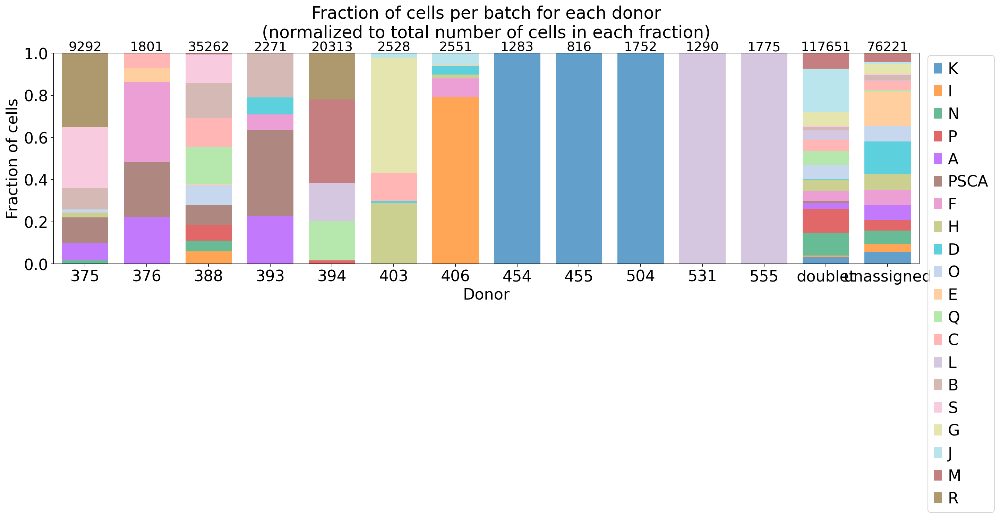

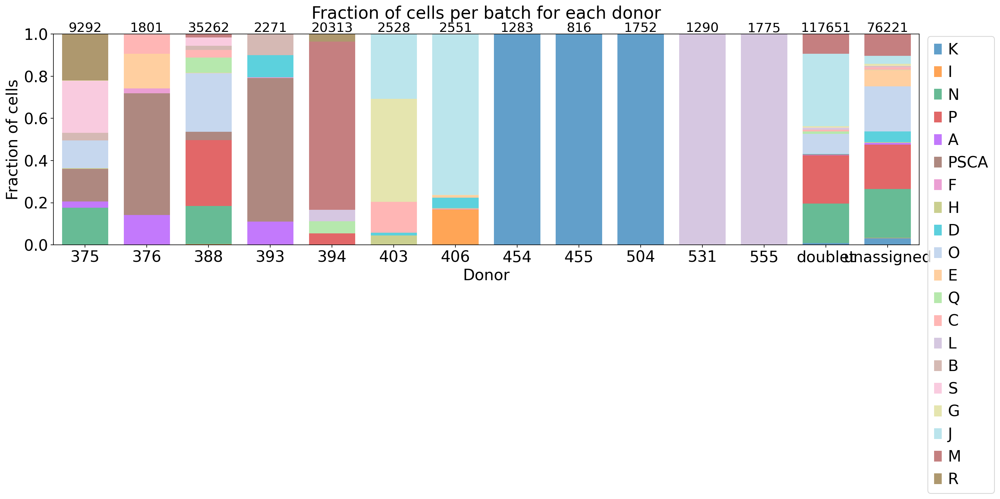

In [46]:
plot_fraction_per_sample(
    adata,
    groups="donor",
    fractions="sample",
    normalize_to_total=True,
    title="Fraction of cells per batch for each donor\n(normalized to total number of cells in each fraction)",
)

plot_fraction_per_sample(
    adata,
    groups="donor",
    fractions="sample",
    normalize_to_total=False,
    title="Fraction of cells per batch for each donor",
)

___

# Split adata per donor

In [47]:
donor_list = adata.obs["donor"].unique()

donor_adatas = []
for donor in donor_list:
    if not pd.isnull(donor) and donor != "unassigned" and donor != "doublet":
        # Remove all data except from one donor 
        adata_tmp = adata[adata.obs["donor"] == donor].copy()

        # Store raw counts before normalization
        adata_tmp.raw = adata_tmp

        print("Donor: ", donor)
        print(adata_tmp)

        donor_adatas.append(adata_tmp)

Donor:  504
AnnData object with n_obs × n_vars = 1752 × 27394
    obs: 'species', 'tissue', 'library_id', 'sample', 'percent_mito', 'n_counts', 'n_genes', 'cell_barcode_x', 'donor_id_x', 'cell_barcode_y', 'donor_id_y', 'cell_barcode', 'donor', 'donor_id', 'barcode', 'timepoint'
    var: 'n_cells'
    layers: 'spliced', 'unspliced'
Donor:  454
AnnData object with n_obs × n_vars = 1283 × 27394
    obs: 'species', 'tissue', 'library_id', 'sample', 'percent_mito', 'n_counts', 'n_genes', 'cell_barcode_x', 'donor_id_x', 'cell_barcode_y', 'donor_id_y', 'cell_barcode', 'donor', 'donor_id', 'barcode', 'timepoint'
    var: 'n_cells'
    layers: 'spliced', 'unspliced'
Donor:  455
AnnData object with n_obs × n_vars = 816 × 27394
    obs: 'species', 'tissue', 'library_id', 'sample', 'percent_mito', 'n_counts', 'n_genes', 'cell_barcode_x', 'donor_id_x', 'cell_barcode_y', 'donor_id_y', 'cell_barcode', 'donor', 'donor_id', 'barcode', 'timepoint'
    var: 'n_cells'
    layers: 'spliced', 'unspliced'
Do

___

# Plot number of raw CAR counts / CAR expressing cells per donor per timepoint

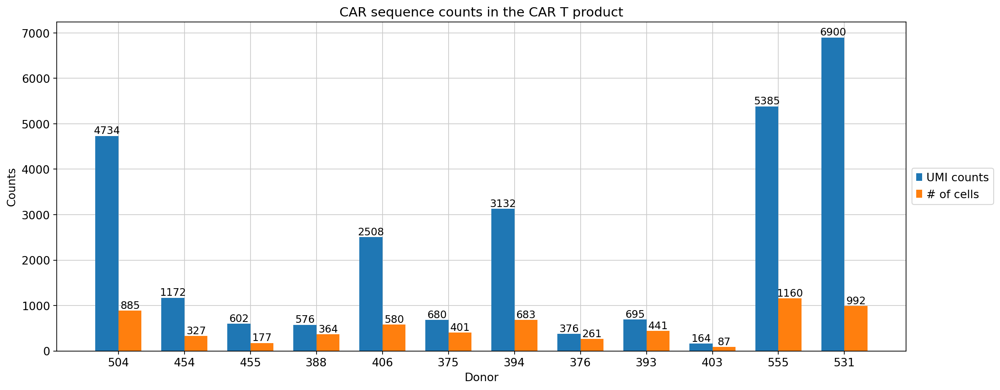

In [48]:
fig, ax = plt.subplots(figsize=(15, 6))

width = 0.35
fontsize = 12

labels = []
CAR_per_tp = []
CAR_cells_per_tp = []
for i, donor_adata in enumerate(donor_adatas):
    temp = donor_adata[donor_adata.obs.timepoint == "IP", :].copy()
    CAR_per_tp.append(temp.X[:, temp.var.index=="CAR"].todense().sum())
    
    temp = donor_adata[donor_adata.obs.timepoint == "IP", :].copy()
    CAR_cells_per_tp.append(len(temp[temp.X[:, temp.var.index=="CAR"].todense()>0]))
    
    labels.append(donor_adata.obs["donor"][0])
        
x = np.arange(len(labels))

rects1 = ax.bar(x - width/2, CAR_per_tp, width, label="UMI counts")
ax.bar_label(rects1, fontsize=fontsize-1)

rects2 = ax.bar(x + width/2, CAR_cells_per_tp, width, label="# of cells")
ax.bar_label(rects2, fontsize=fontsize-1)

ax.set_ylabel("Counts", fontsize=fontsize)
ax.set_xlabel("Donor", fontsize=fontsize)
ax.set_title("CAR sequence counts in the CAR T product", fontsize=fontsize+2)
ax.set_xticks(x, labels, fontsize=fontsize)
ax.tick_params(axis='both', which='major', labelsize=fontsize)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=fontsize)

# ax.grid(axis='x')
ax.set_axisbelow(True)

fig.tight_layout()

fig.savefig(f"figures/1_IP_CAR_counts.png", dpi=300, bbox_inches='tight')
# fig.savefig(f"figures/1_IP_CAR_counts.svg", dpi=300, bbox_inches='tight')

fig.show()

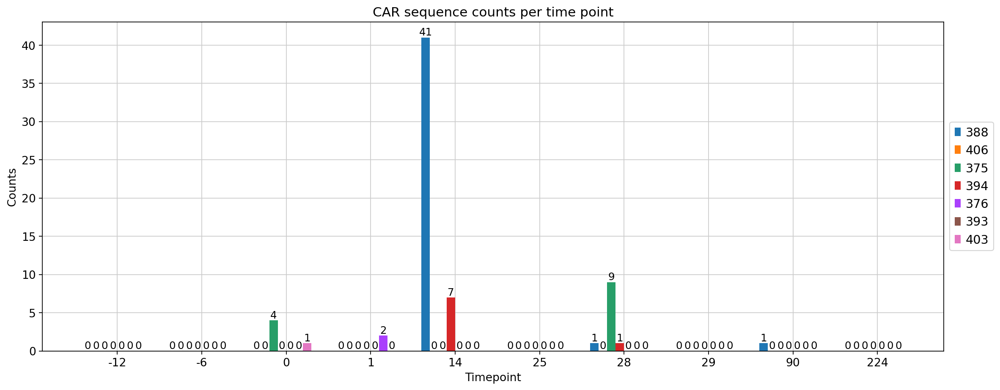

In [49]:
fig, ax = plt.subplots(figsize=(15,6))

# Only plot donors for which PB samples (=timepoints other than IP) are available
donors_to_plot = ['375', '376', '388', '393', '394', '403', '406']
timepoints = [-12, -6, 0, 1, 14, 25, 28, 29, 90, 224]
labels = timepoints
x = np.arange(len(labels))
width = 0.1
fontsize = 12

locs = [-3.5*width, -2.5*width, -1.5*width, -width/2, 1.5*width, width/2, 2.5*width]

i = 0
for donor_adata in donor_adatas:
    if donor_adata.obs["donor"][0] in donors_to_plot:
        CAR_per_tp = []
        for tp in timepoints:
            temp = donor_adata[donor_adata.obs.timepoint == tp, :].copy()
            CAR_per_tp.append(temp.X[:, temp.var.index=="CAR"].todense().sum())

        rects = ax.bar(x + locs[i], CAR_per_tp, width, label=donor_adata.obs["donor"][0])
        ax.bar_label(rects, fontsize=fontsize-1)
        i += 1

ax.set_ylabel("Counts", fontsize=fontsize)
ax.set_xlabel("Timepoint", fontsize=fontsize)
ax.set_title("CAR sequence counts per time point", fontsize=fontsize+2)
ax.set_xticks(x, labels, fontsize=fontsize)
ax.tick_params(axis='both', which='major', labelsize=fontsize)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

ax.set_axisbelow(True)

fig.tight_layout()

# fig.savefig(f"figures/1_CAR_counts_per_tp.png", dpi=300, bbox_inches='tight')

fig.show()

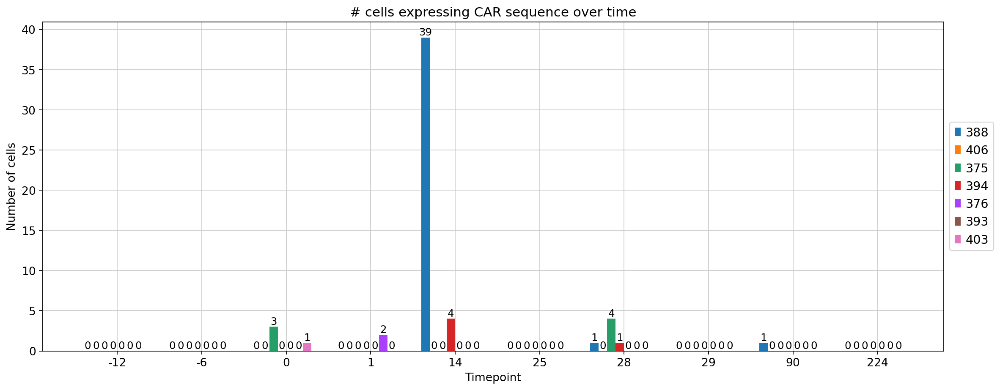

In [50]:
fig, ax = plt.subplots(figsize=(15, 6))

# Only plot donors for which PB samples (=timepoints other than IP) are available
donors_to_plot = ['375', '376', '388', '393', '394', '403', '406']
timepoints = [-12, -6, 0, 1, 14, 25, 28, 29, 90, 224]
labels = timepoints
x = np.arange(len(labels))
width = 0.1
fontsize = 12

locs = [-3.5*width, -2.5*width, -1.5*width, -width/2, 1.5*width, width/2, 2.5*width]

i = 0
for donor_adata in donor_adatas:
    if donor_adata.obs["donor"][0] in donors_to_plot:
        CAR_cells_per_tp = []
        for tp in timepoints:
            temp = donor_adata[donor_adata.obs.timepoint == tp, :].copy()
            CAR_cells_per_tp.append(len(temp[temp.X[:, temp.var.index=="CAR"].todense()>0]))

        rects = ax.bar(x + locs[i], CAR_cells_per_tp, width, label=donor_adata.obs["donor"][0])
        ax.bar_label(rects, fontsize=fontsize-1)
        i += 1

ax.set_ylabel("Number of cells", fontsize=fontsize)
ax.set_xlabel("Timepoint", fontsize=fontsize)
ax.set_title("# cells expressing CAR sequence over time", fontsize=fontsize+2)
ax.set_xticks(x, labels, fontsize=fontsize)
ax.tick_params(axis='both', which='major', labelsize=fontsize)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

ax.set_axisbelow(True)

fig.tight_layout()

# fig.savefig(f"figures/1_CAR_cell_counts_per_tp.png", dpi=300, bbox_inches='tight')

fig.show()

___

# Normalize without batch correction

In [51]:
# Store raw counts before normalization
adata.raw = adata

In [52]:
# sc.pl.highest_expr_genes(adata, n_top=20)

Normalization:

In [53]:
## log(CP10k+1)
# CP10k normalization
sc.pp.normalize_total(adata, target_sum=10**4) 
# log(expression + 1)
sc.pp.log1p(adata) # log(expression + 1)

Highest expressed genes after normalization:

In [54]:
# sc.pl.highest_expr_genes(adata, n_top=20)

Annotate highly variable genes:

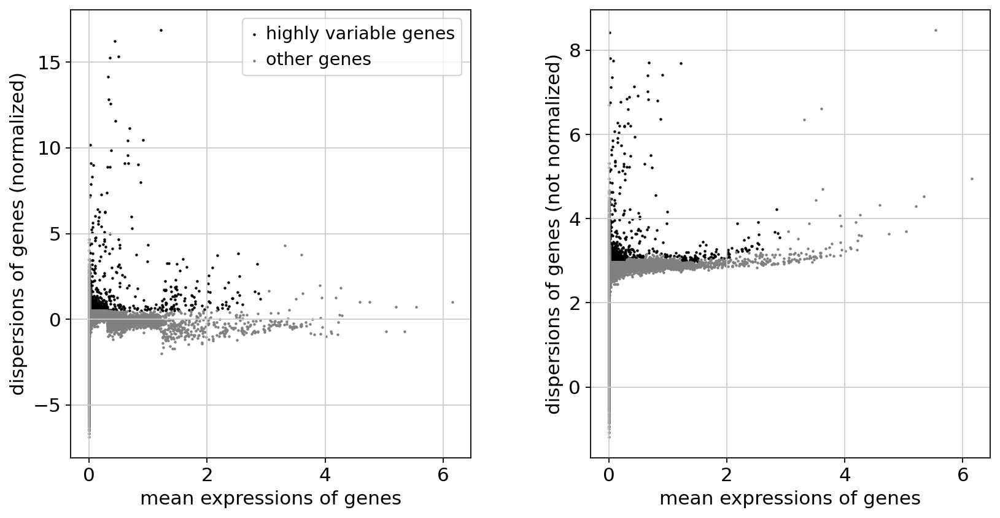

In [55]:
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)

Save normalized data containing data from all donors and timepoints:

In [56]:
adata.obs["timepoint"] = adata.obs["timepoint"].astype(str)
adata.write(f"../COH_data/alignment_v2/all_norm.h5ad")

Save data for donor 388 separately:

In [57]:
adata_388 = adata[adata.obs["donor"]=="388"]
adata_388.write(f"../COH_data/alignment_v2/donor388_norm.h5ad")
adata_388

View of AnnData object with n_obs × n_vars = 35262 × 27394
    obs: 'species', 'tissue', 'library_id', 'sample', 'percent_mito', 'n_counts', 'n_genes', 'cell_barcode_x', 'donor_id_x', 'cell_barcode_y', 'donor_id_y', 'cell_barcode', 'donor', 'donor_id', 'barcode', 'timepoint'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'spliced', 'unspliced'

___